In [2]:
import numpy as np
from scipy import stats
from matplotlib import pyplot as plt
import pandas as pd
import random
import tqdm
import h5py
from sklearn.model_selection import train_test_split
import corner
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import GaussianNB
from astroML.utils import completeness_contamination
import seaborn as sns
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

plt.rc('text', usetex=True)
plt.rc('font', family='serif')

%matplotlib inline
%config InlineBackend.figure_format='retina'

In [2]:
with h5py.File('sample_2e7_design_precessing_higherordermodes_3detectors.h5', 'r') as file:
    
    keys = list(file.keys())
    print(keys)
    
    data = {}
    for key in keys:
        data[key] = file[key][:]

['chi1x', 'chi1y', 'chi1z', 'chi2x', 'chi2y', 'chi2z', 'dec', 'det', 'iota', 'mtot', 'psi', 'q', 'ra', 'snr', 'z']


In [3]:
total_samples = len(data['det'])
num_train_samples = 100000 #these will be used for train and validation
num_test_samples = 30000 #these will be used for testing. For capacity issues I am not using the entire dataset

random_indices = np.random.choice(total_samples, num_train_samples + num_test_samples, replace=False)

train_indices = random_indices[:num_train_samples]
test_indices = random_indices[num_train_samples:num_train_samples + num_test_samples]

par_keys = ['mtot', 'q', 'chi1x', 'chi1y', 'chi1z', 'chi2x', 'chi2y', 'chi2z', 'dec', 'ra', 'iota', 'psi', 'z']

#train and val data
par = np.column_stack([data[key][train_indices] for key in par_keys])
labels = data['det'][train_indices].copy()
snr = data['snr'][train_indices].copy()

#test data
par_test = np.column_stack([data[key][test_indices] for key in par_keys])
labels_test = data['det'][test_indices].copy()
snr_test = data['snr'][test_indices].copy()

In [ ]:
#a check
for key in keys:
    print(len(data[key]), len(data_batch[key]))

In [3]:
#lately my kernel dies when I try to read the h5 so I have saved what I need and I can use this cell only
def load_data():
    par = np.loadtxt('train_data.txt', delimiter=',')
    labels = np.loadtxt('train_labels.txt', delimiter=',')
    snr = np.loadtxt('train_snr.txt', delimiter=',')

    par_test = np.loadtxt('test_data.txt', delimiter=',')
    labels_test = np.loadtxt('test_labels.txt', delimiter=',')
    snr_test = np.loadtxt('test_snr.txt', delimiter=',')
    
    return par, labels, snr, par_test, labels_test, snr_test

par, labels, snr, par_test, labels_test, snr_test = load_data()
keys = ['chi1x', 'chi1y', 'chi1z', 'chi2x', 'chi2y', 'chi2z', 'dec', 'det', 'iota', 'mtot', 'psi', 'q', 'ra', 'snr', 'z']
par_keys = ['mtot', 'q', 'chi1x', 'chi1y', 'chi1z', 'chi2x', 'chi2y', 'chi2z', 'dec', 'ra', 'iota', 'psi', 'z']


In [4]:
# divide the par in train, val, test
par_train, par_val, lab_train, lab_val = train_test_split(par, labels, test_size=0.3, random_state=7)
print(len(par_train), len(par_val))

70000 30000


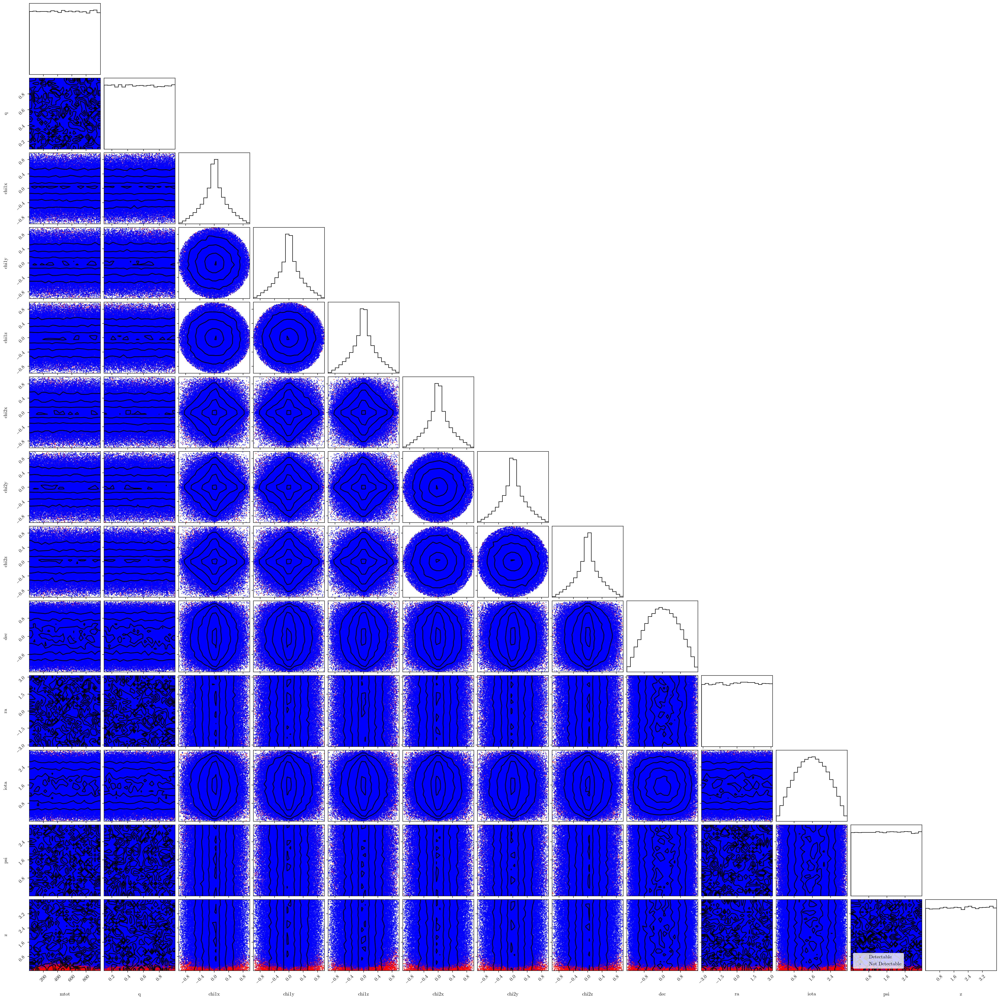

In [6]:
figure = corner.corner(par, labels=par_keys, plot_datapoints=False)

axes = np.array(figure.axes).reshape(len(par_keys), len(par_keys))

for i in range(len(par_keys)):
    for j in range(i):
        ax = axes[i, j]
        ax.scatter(par[labels == 1, j], par[labels == 1, i], color="red", s=1, label="Detectable", alpha=0.5)
        ax.scatter(par[labels == 0, j], par[labels == 0, i], color="blue", s=1, label="Not Detectable", alpha=0.5)
ax.legend()
plt.show()

in the last row we can clearly see that we have a huge amount of detectable sources at low z, sort of clustered.

Let's explore more in details

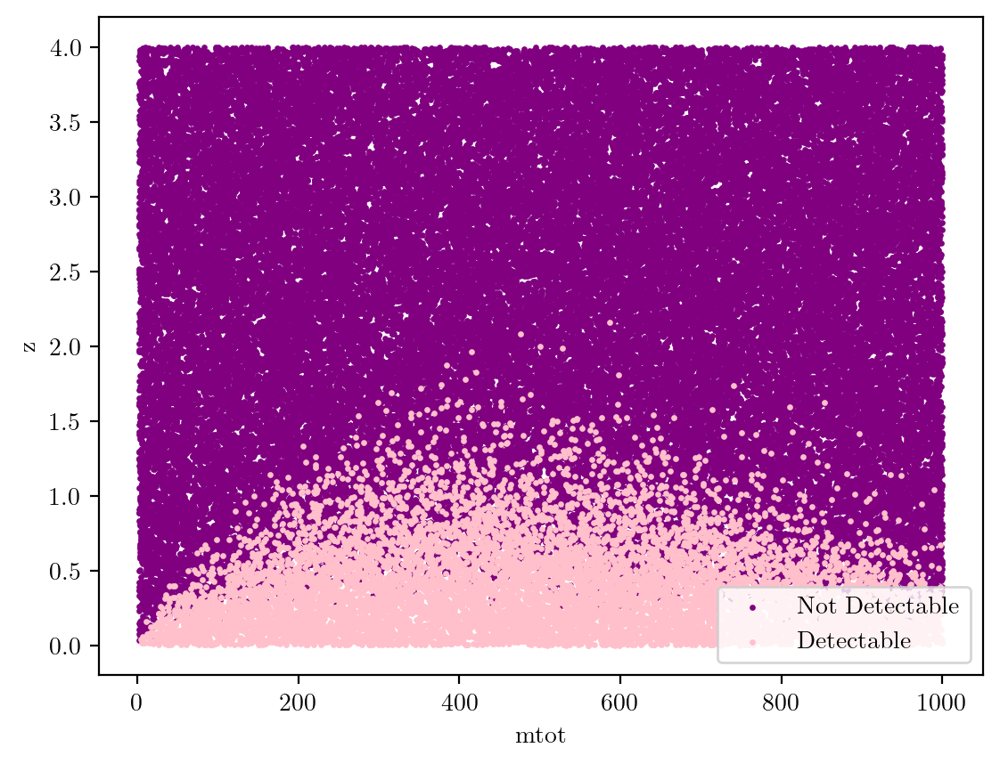

In [9]:
#scatter plot of only Total mass and redshift

plt.scatter(par_train[lab_train==0,0], par_train[lab_train==0,-1], color = 'purple', label='Not Detectable', s=2)
plt.scatter(par_train[lab_train==1,0], par_train[lab_train==1,-1], color = 'pink', label='Detectable', s=2)
plt.xlabel('mtot')
plt.ylabel('z')
plt.legend()
plt.show()

From a physical point of view it makes sense that all my detectable sources are clustered in a region of low redshift, because the closer the easier to be seen

## Support Vector Machine with Kernel Methods (Radial Basis Function) with just these 2 features (M$_{tot}$ & z)

In [14]:
def plot_predictions(clf, axes):
    x0s = np.linspace(axes[0], axes[1], 100)
    x1s = np.linspace(axes[2], axes[3], 100)
    x0, x1 = np.meshgrid(x0s, x1s)
    X = np.c_[x0.ravel(), x1.ravel()]
    
    y_pred = clf.predict(X).reshape(x0.shape)
    y_decision = clf.decision_function(X).reshape(x0.shape)
    
    #prediction regions
    plt.contourf(x0, x1, y_pred, cmap=plt.cm.RdYlBu, alpha=0.3)
    #dec boundaries
    plt.contour(x0, x1, y_decision, colors='black', levels=[0], linewidths=2)

    
def plot_dataset(X, y, axes):
    plt.scatter(X[:, 0][y == 0], X[:, 1][y == 0], s=10, color='yellow', label='Class 0', alpha=0.8)
    plt.scatter(X[:, 0][y == 1], X[:, 1][y == 1], s=10, color='orange', label='Class 1', alpha=0.8)
    plt.axis(axes)
    plt.grid(True, which='both')
    plt.xlabel(r"$x_1$", fontsize=20)
    plt.ylabel(r"$x_2$", fontsize=20, rotation=0)
    plt.legend()

In [17]:
X_val =  np.column_stack([par_val[:,0], par_val[:,-1]]) 
X = np.column_stack([par_train[:,0], par_train[:,-1]])
y = lab_train

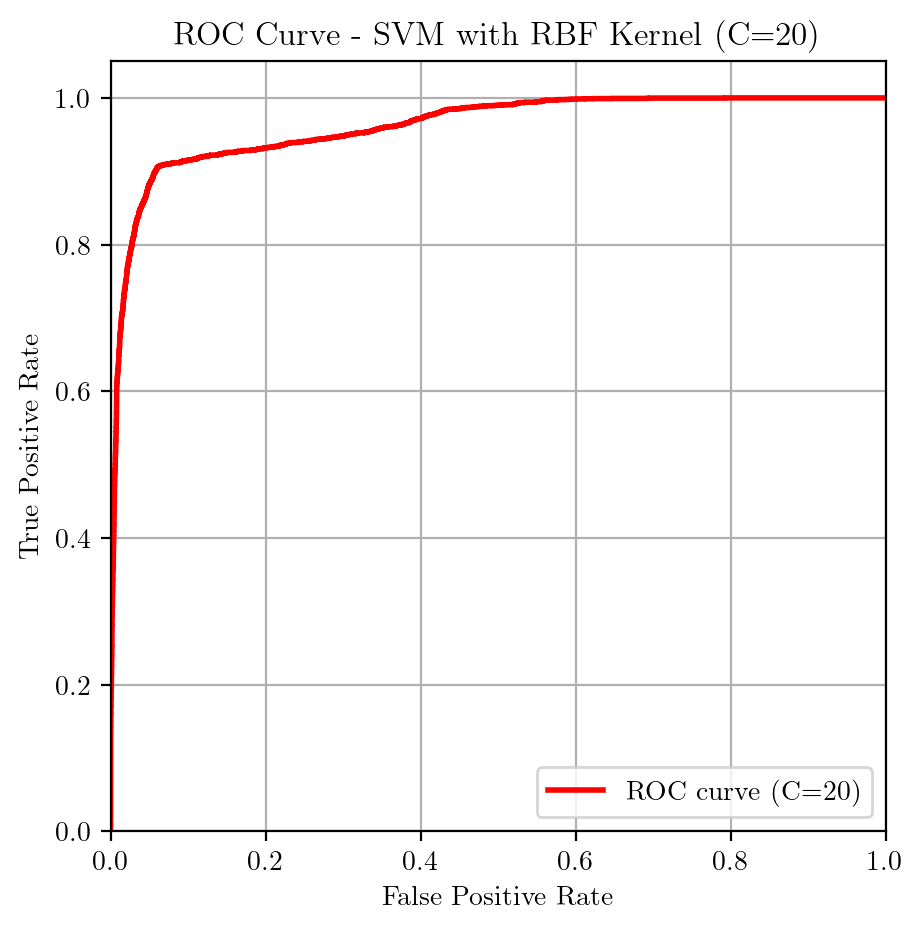

Accuracy with C=20: 0.9481


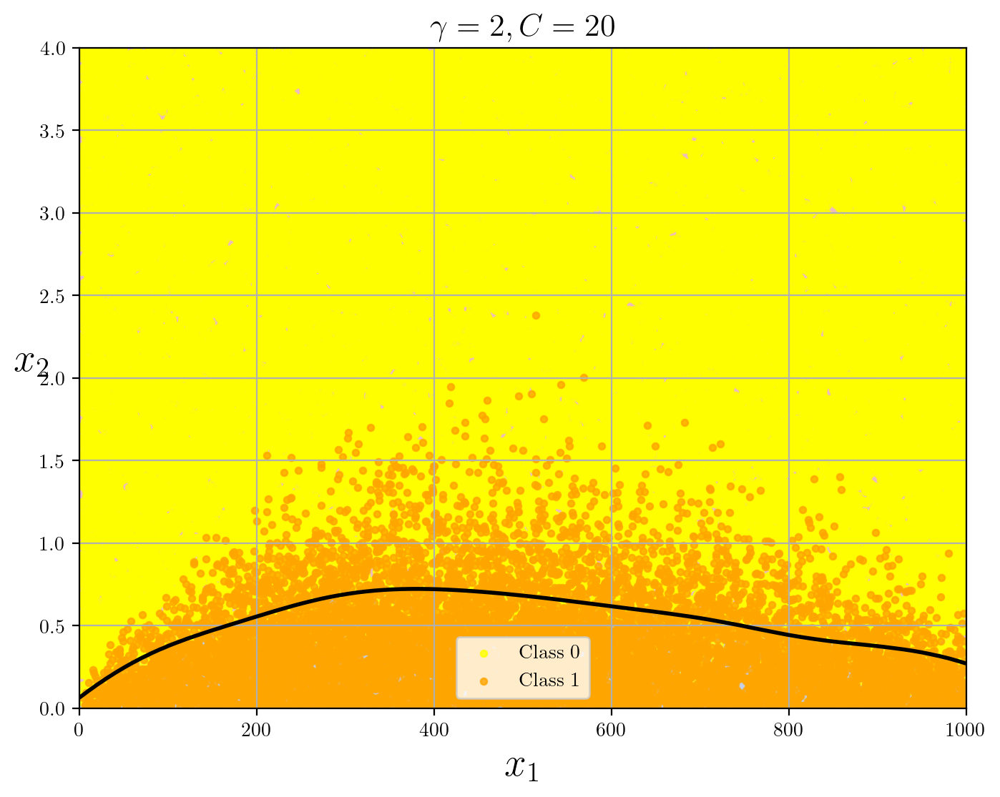

In [18]:
gamma_C20 = 2
C_C20 = 20
hyperparams_C20 = (gamma_C20, C_C20)

rbf_kernel_svm_clf_C20 = Pipeline([
    ("scaler", StandardScaler()),
    ("svm_clf", SVC(kernel="rbf", gamma=gamma_C20, C=C_C20, probability=True))
])

rbf_kernel_svm_clf_C20.fit(X, y)

y_prob_C20 = rbf_kernel_svm_clf_C20.predict_proba(X_val)[:, 1]
y_pred_C20 = rbf_kernel_svm_clf_C20.predict(X_val)

fpr_C20, tpr_C20, _C20 = roc_curve(lab_val, y_prob_C20)
roc_auc_C20 = auc(fpr_C20, tpr_C20)

plt.figure(figsize=(5, 5))
plt.plot(fpr_C20, tpr_C20, color='red', lw=2, label=f'ROC curve (C=20)')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - SVM with RBF Kernel (C=20)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

accuracy_C20 = accuracy_score(lab_val, y_pred_C20)
print(f'Accuracy with C=20: {accuracy_C20:.4f}')

plt.figure(figsize=(8, 6))
plot_predictions(rbf_kernel_svm_clf_C20, [0, 1000, 0, 4])
plot_dataset(X, y, [0, 1000, 0, 4])

gamma_C20, C_C20 = hyperparams_C20
plt.title(r"$\gamma = {}, C = {}$".format(gamma_C20, C_C20), fontsize=16)

plt.show()


#### Cross Validation to search for optimal gamma and C

Best parameters: {'svm_clf__C': 50, 'svm_clf__gamma': 2}


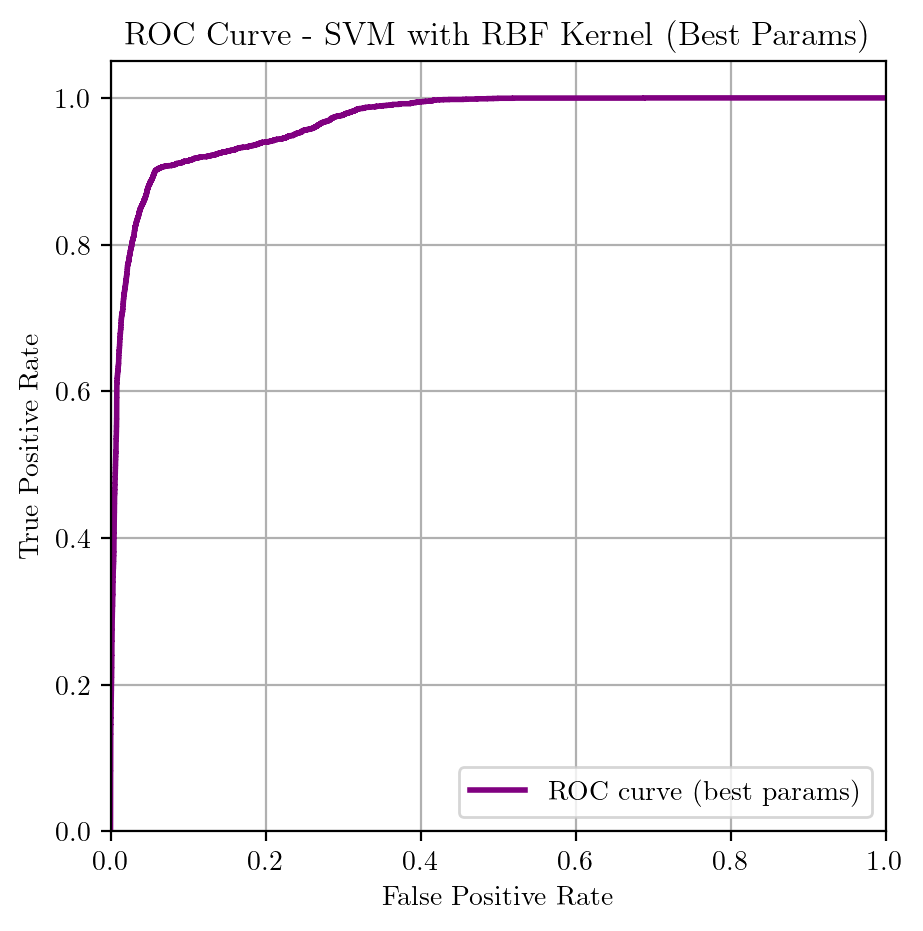

Accuracy with best parameters: 0.9479


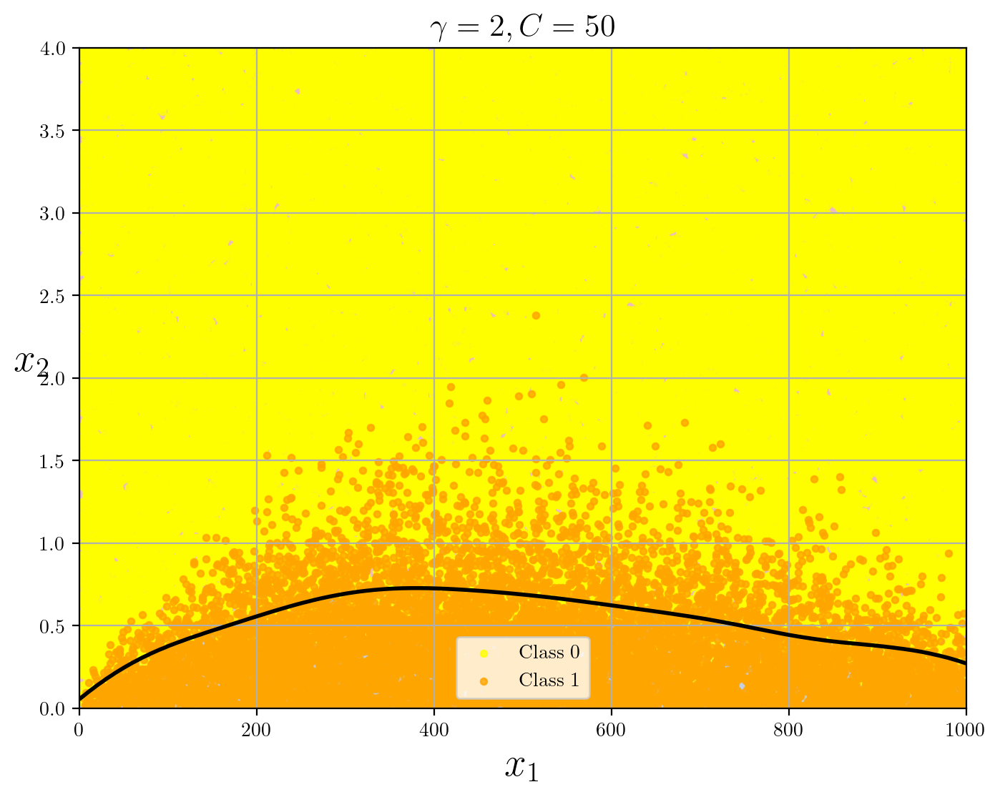

In [19]:
param_grid = {
    'svm_clf__C': [1, 20, 50, 100],
    'svm_clf__gamma': [0.1, 2, 10]
}

rbf_kernel_svm_clf = Pipeline([
    ("scaler", StandardScaler()),
    ("svm_clf", SVC(kernel="rbf", probability=True))
])

grid_search = GridSearchCV(rbf_kernel_svm_clf, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X, y)

best_params = grid_search.best_params_
print(f'Best parameters: {best_params}')

# Use best model to predict on validation set
best_svm_clf = grid_search.best_estimator_
y_prob_best = best_svm_clf.predict_proba(X_val)[:, 1]
y_pred_best = best_svm_clf.predict(X_val)

fpr_best, tpr_best, _ = roc_curve(lab_val, y_prob_best)

plt.figure(figsize=(5, 5))
plt.plot(fpr_best, tpr_best, color='purple', lw=2, label='ROC curve (best params)')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - SVM with RBF Kernel (Best Params)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

accuracy_best = accuracy_score(lab_val, y_pred_best)
print(f'Accuracy with best parameters: {accuracy_best:.4f}')

plt.figure(figsize=(8, 6))
plot_predictions(best_svm_clf, [0, 1000, 0, 4])
plot_dataset(X, y, [0, 1000, 0, 4])

plt.title(r"$\gamma = {}, C = {}$".format(best_params['svm_clf__gamma'], best_params['svm_clf__C']), fontsize=16)

plt.show()


So the best model according to the cross val is with C=50 and $\gamma$=2 and it has an accuracy of 0.9479

## Gaussian Naive Bayes

From the corner plot above it doesn't seem that the features have huge correlation, but let's check

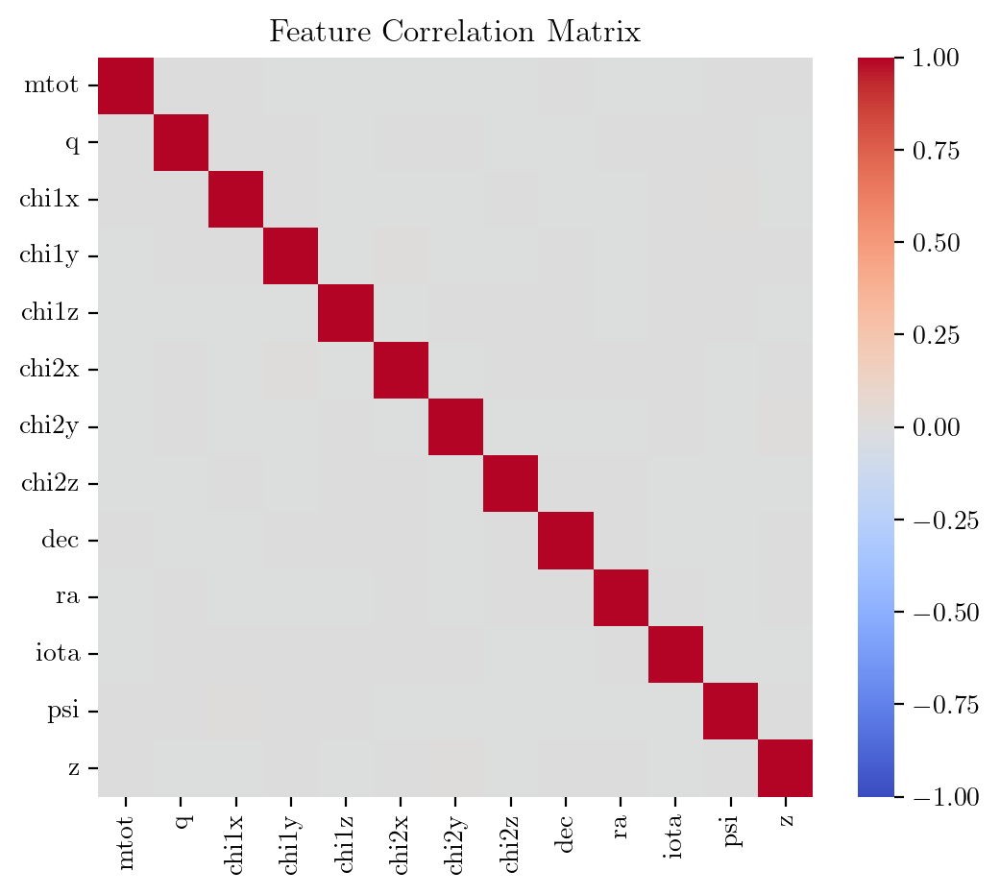

In [13]:
df = pd.DataFrame(par_train, columns=par_keys)
corr_matrix = df.corr()

plt.figure(figsize=(6, 5))
sns.heatmap(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Feature Correlation Matrix")
plt.show()


Gaussian Naive Bayes 
Completeness = [0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.87912341] 
Contamination = [0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.25435336]


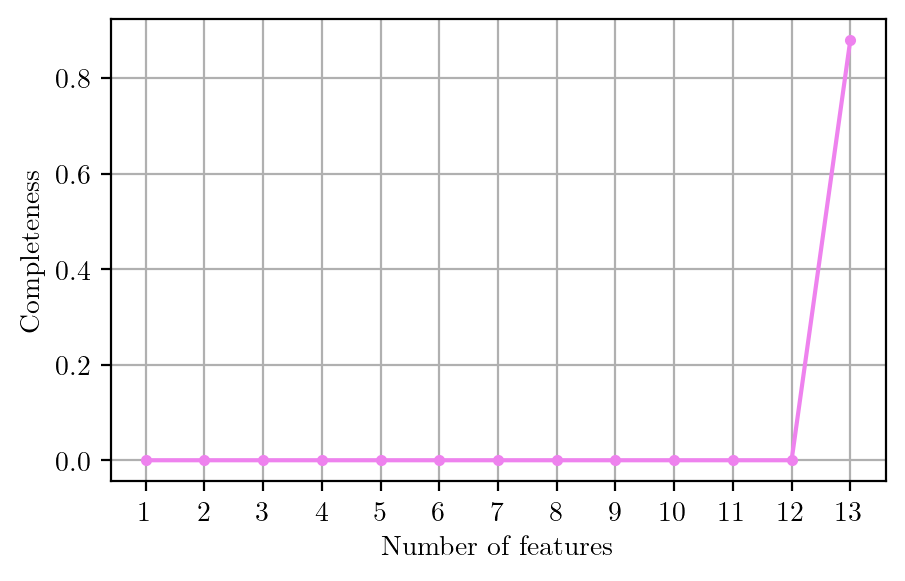

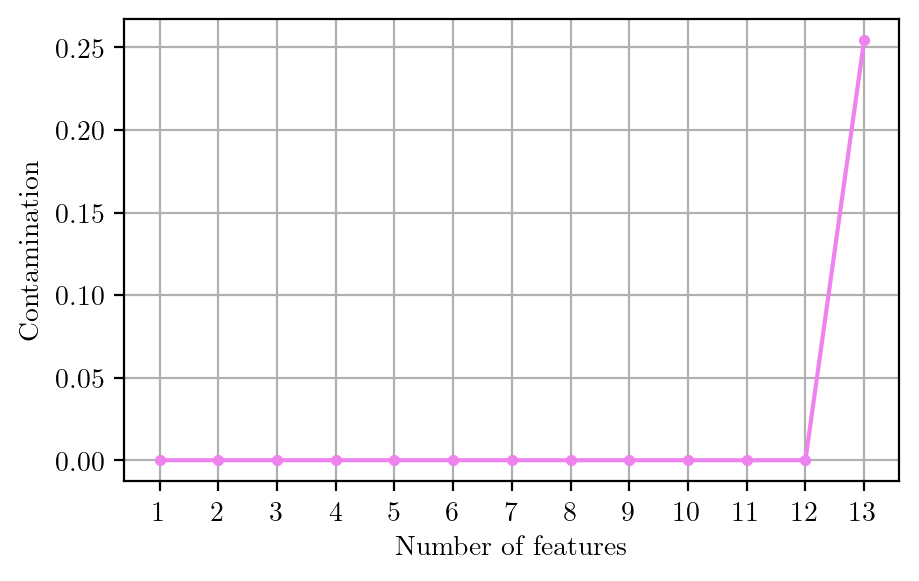

In [85]:
feat = np.linspace(1,len(par_keys),len(par_keys))
lab_prob = []
lab_pred = []

for x in feat:
    
    gnb = GaussianNB()
    gnb.fit(par_train[:,:int(x)],lab_train)
    
    pred_labels = gnb.predict(par_val[:,:int(x)])
    pred_probs = gnb.predict_proba(par_val[:,:int(x)])[:, 1]
    
    lab_pred.append(pred_labels)
    lab_prob.append(pred_probs)

completeness, contamination = completeness_contamination(lab_pred, lab_val)
print(f'Gaussian Naive Bayes \nCompleteness = {completeness} \nContamination = {contamination}')

plt.figure(figsize=(5,3))
plt.plot(feat, completeness, marker='.', color='violet')
plt.xlabel('Number of features')
plt.ylabel('Completeness')
plt.xticks(feat)
plt.grid()
plt.show()

plt.figure(figsize=(5,3))
plt.plot(feat, contamination, marker='.', color='violet')
plt.xlabel('Number of features')
plt.ylabel('Contamination')
plt.xticks(feat)
plt.grid()
plt.show()

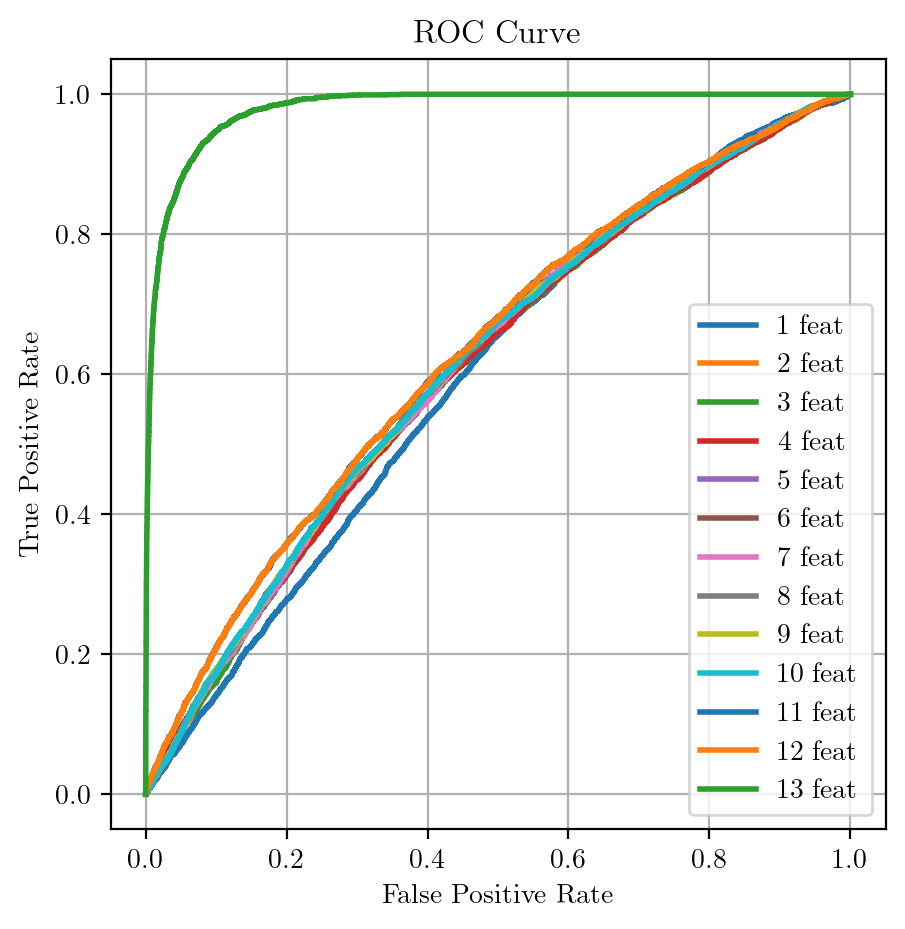

In [86]:
plt.figure(figsize=(5, 5))

for i in feat:
    fpr, tpr, _ = roc_curve(lab_val, lab_prob[int(i-1)])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{int(i)} feat')


plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

In [87]:
accuracy = accuracy_score(lab_val, lab_pred[-1])
print(f"Accuracy gauss naive considering all the features: {accuracy:.4f}")

Accuracy gauss naive considering all the features: 0.9392


Very strange result, it seems that the last feature, which is the redshift is VERY important. So I'll try to do the opposite and start from the first feature alone which will be z and then add all the others to see what's changing


Gaussian Naive Bayes 
Completeness = [0.85790081 0.85790081 0.86182238 0.86136101 0.86228374 0.8627451
 0.86251442 0.86297578 0.86482122 0.86482122 0.86482122 0.87081892
 0.87912341] 
Contamination = [0.29121403 0.29161905 0.28429119 0.28330134 0.28363358 0.2820119
 0.28220388 0.28195777 0.27917708 0.27806663 0.27820562 0.26982592
 0.25435336]


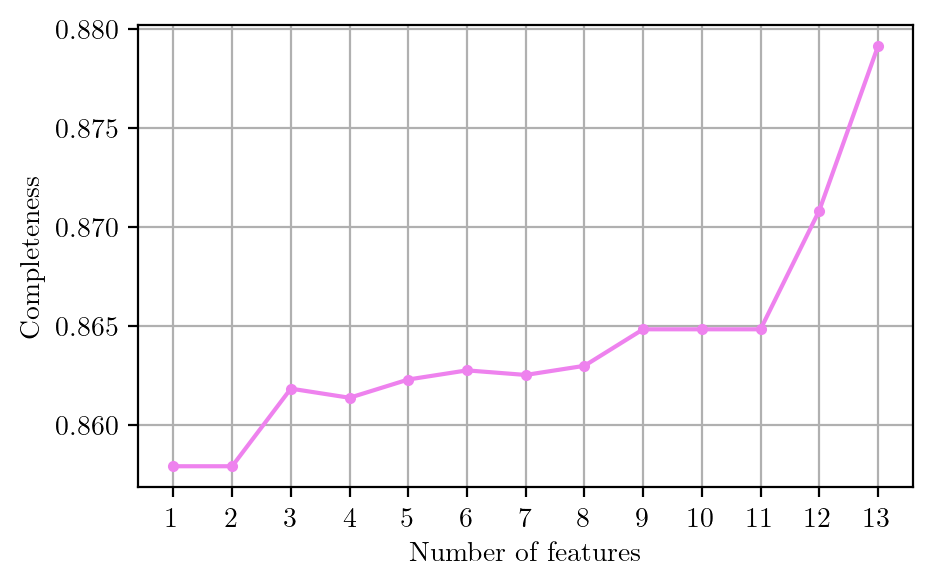

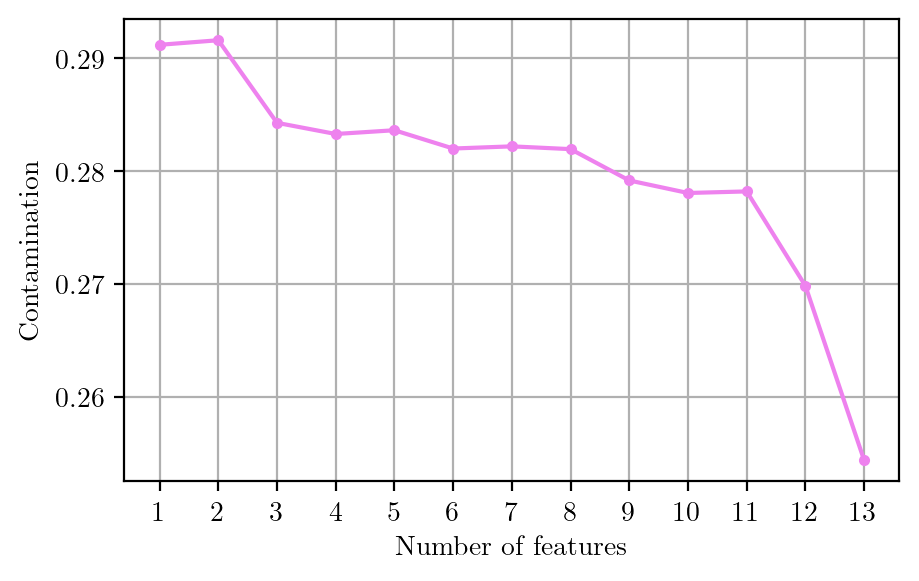

In [88]:
feat = np.linspace(1,len(par_keys),len(par_keys))
lab_prob = []
lab_pred = []

for x in feat:
    
    gnb = GaussianNB()
    gnb.fit(par_train[:,int(13-x):13],lab_train)
    
    pred_labels = gnb.predict(par_val[:, int(13-x):13])
    pred_probs = gnb.predict_proba(par_val[:, int(13-x):13])[:, 1]
    
    lab_pred.append(pred_labels)
    lab_prob.append(pred_probs)

completeness, contamination = completeness_contamination(lab_pred, lab_val)
print(f'Gaussian Naive Bayes \nCompleteness = {completeness} \nContamination = {contamination}')

plt.figure(figsize=(5,3))
plt.plot(feat, completeness, marker='.', color='violet')
plt.xlabel('Number of features')
plt.ylabel('Completeness')
plt.xticks(feat)
plt.grid()
plt.show()

plt.figure(figsize=(5,3))
plt.plot(feat, contamination, marker='.', color='violet')
plt.xlabel('Number of features')
plt.ylabel('Contamination')
plt.xticks(feat)
plt.grid()
plt.show()

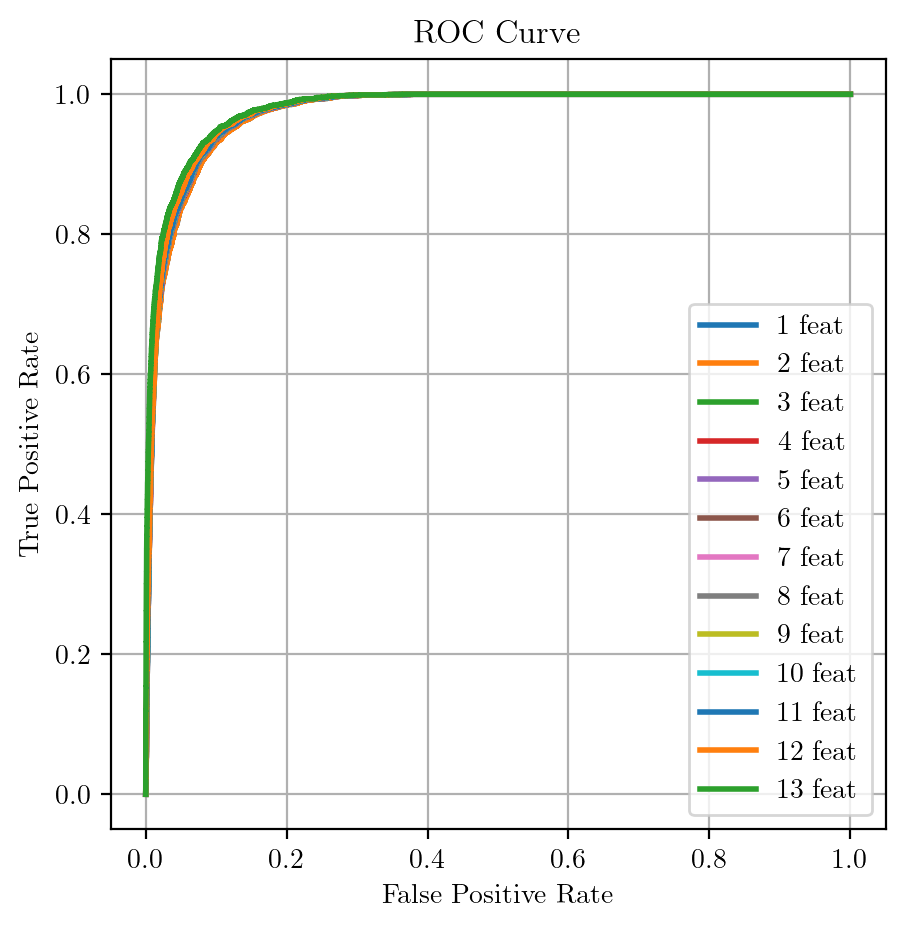

In [89]:
plt.figure(figsize=(5, 5))

for i in feat:
    fpr, tpr, _ = roc_curve(lab_val, lab_prob[int(i-1)])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{int(i)} feat')


plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

Accuracy gauss naive considering all the features: 0.9392
Accuracy gauss naive considering only z: 0.9285


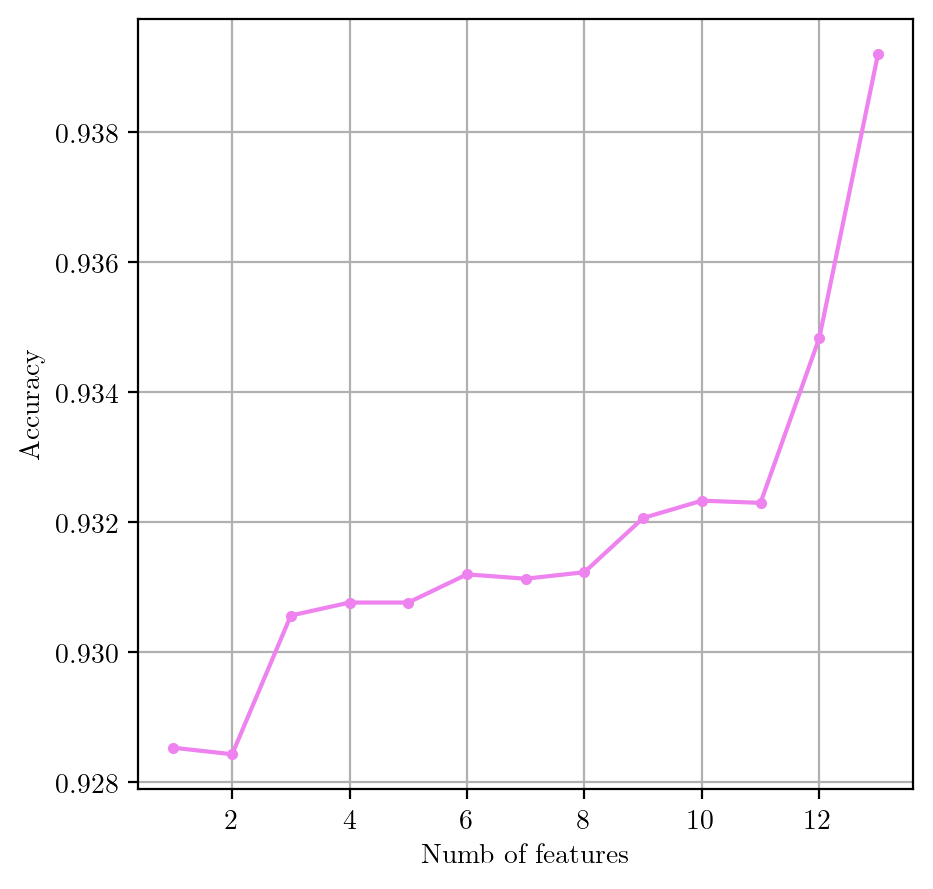

In [94]:
accuracy = accuracy_score(lab_val, lab_pred[-1])
print(f"Accuracy gauss naive considering all the features: {accuracy:.4f}")
accuracy_z = accuracy_score(lab_val, lab_pred[0])
print(f"Accuracy gauss naive considering only z: {accuracy_z:.4f}")

plt.figure(figsize=(5, 5))
accuracy=[]

for l in lab_pred:
    accuracy.append(accuracy_score(lab_val, l))

plt.plot(feat, accuracy, marker='.', color='violet')
plt.xlabel('Numb of features')
plt.ylabel('Accuracy')
plt.grid()
plt.show()


So actually adding all the features the accuracy is improved by 1% 

## Bagging classifier

In [105]:
bag_clf = BaggingClassifier(
    DecisionTreeClassifier(random_state=42), 
    n_estimators=2000, max_samples=0.7,
    bootstrap=True, random_state=42, n_jobs=-1)

%timeit bag_clf.fit(par_train, lab_train)

lab_pred_bag = bag_clf.predict(par_val)

print(accuracy_score(lab_val, lab_pred_bag))

4min 50s ± 36.4 s per loop (mean ± std. dev. of 7 runs, 1 loop each)
0.9665


In [5]:
X_val =  np.column_stack([par_val[:,0], par_val[:,-1]]) 
X = np.column_stack([par_train[:,0], par_train[:,-1]])
y = lab_train

In [7]:
bag_clf = BaggingClassifier(
    DecisionTreeClassifier(random_state=42), 
    n_estimators=2000, max_samples=0.8,
    bootstrap=True, random_state=42, n_jobs=2)

%timeit bag_clf.fit(X, y)

lab_pred_bag = bag_clf.predict(X_val)

print(accuracy_score(lab_val, lab_pred_bag))

2min 30s ± 738 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
0.9448666666666666


Very impressive, again with just z and Mtot we get 0.945 in accuracy